In [1]:
import numpy as np
from matplotlib import pyplot as plt
import random as rndm

Три функции, согласно заданию.

In [2]:
def fun(x):
    return np.cos(2 * np.pi * x)
    # return 5 * (x ** 3) + x ** 2 + 5
    # return x * np.sin(2 * np.pi * x)

Генерация случайной ошибки с равномерным распределением и с нормальным распределением.

In [3]:
def fun_with_err(x):
    # return fun(x)
    # return fun(x) + np.random.uniform(-0.3., 0.3)
    return fun(x) + rndm.normalvariate(0., 0.3)

Функция, которая считает полином.

In [4]:
def polynom(x, w):
    y = 0
    for i in range(len(w)):
        y += w[i] * (x ** i)
    return y

Генерация n точек на отрезке от 0 до 1. Потом сортировка для правильного отображения функции на картинке.
Можно использовать linspace для лучшего результата. В таком случае, точки генерятся на равном расстоянии друг от друга.
Параметр proportion задает соотношение обучающей и тренировочной выборок. По умолчанию соотношение 80/20.

In [5]:
def generate(n, proportion=0.8):
    # x = np.linspace(0., 1., n)
    x = np.sort(np.random.uniform(0, 1., n))
    y = np.array(list(map(fun, x)))

    set_size = len(x)
    training_size = int(set_size*proportion)

    x_training = x[:training_size+1]
    y_training = np.array(list(map(fun_with_err, x_training)))

    x_test = x[training_size+1:]
    y_test = np.array(list(map(fun_with_err, x_test)))

    return x_training, y_training, x_test, y_test

Ищем веса для полинома в полиномиальной регрессии.
х, у, степень полинома, регуляризационный коэффициент.

![](../../resources/pictures/slau.png)

In [6]:
def find_weights(x, y, m, l):
    A = []
    b = []

    for i in range(m + 1):
        b.append(np.sum((x ** i) * y))
        a = []

        for j in range(m + 1):
            a.append(np.sum(x ** (i + j)))
            if i == j:
                a[j] += l
        A.append(a)

    return np.linalg.solve(A, b)

![](https://econbrowser.com/wp-content/uploads/2019/07/msemae.png)

In [7]:
def mae(y_true, y_pred):
    diff = 0
    for i in range(len(y_true)):
        diff += abs(y_true[i] - y_pred[i])
    return diff/len(y_true)

def mse(y_true, y_pred):
    diff = 0
    for i in range(len(y_true)):
        diff += (y_true[i] - y_pred[i])**2
    return diff/len(y_true)

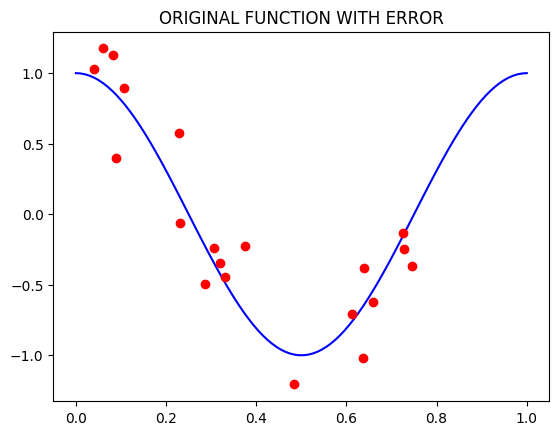

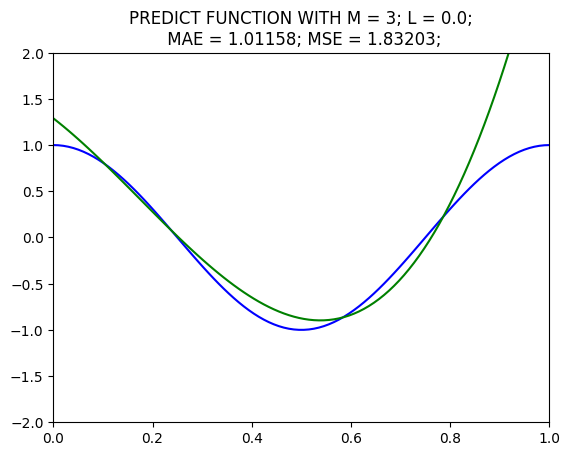

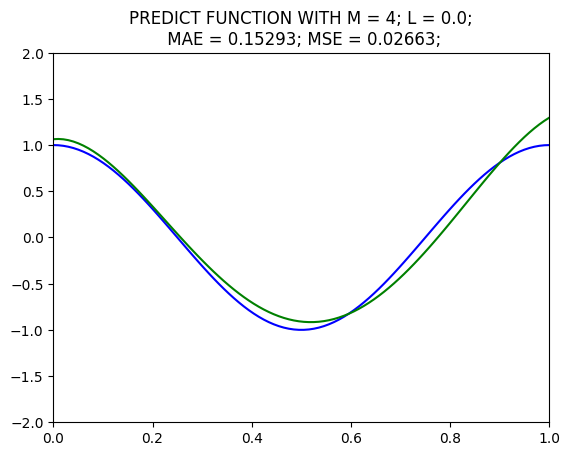

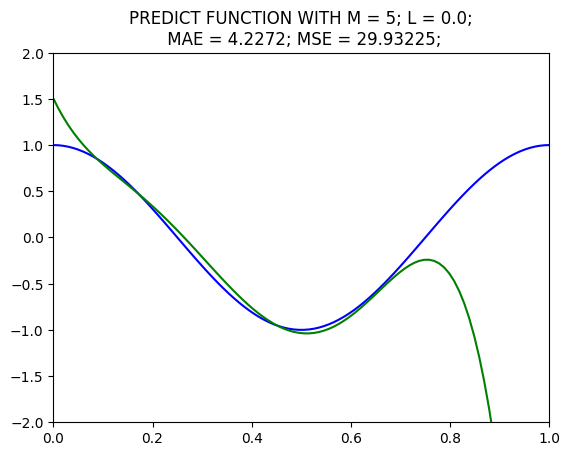

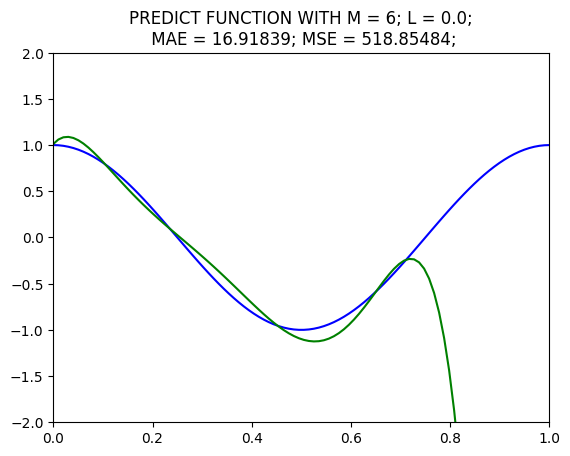

...

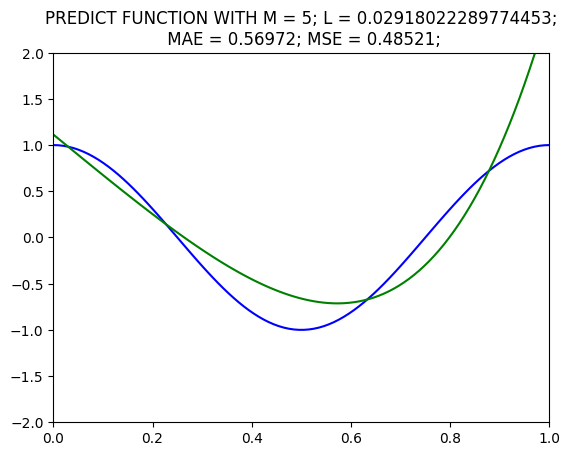

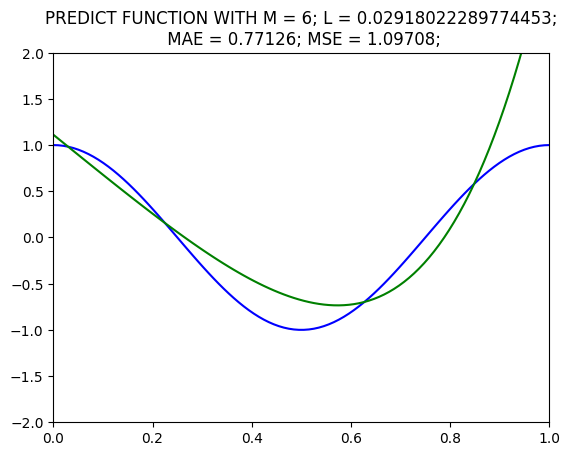

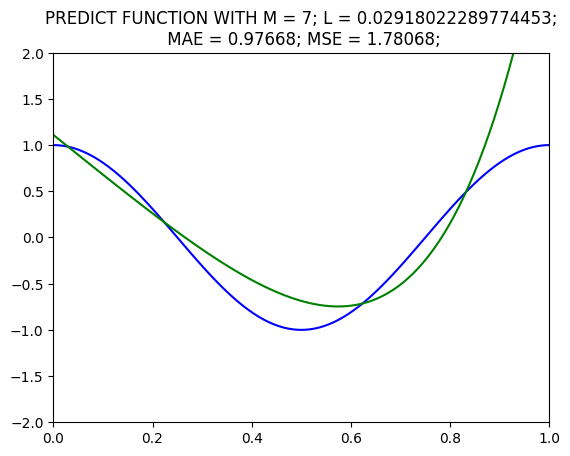

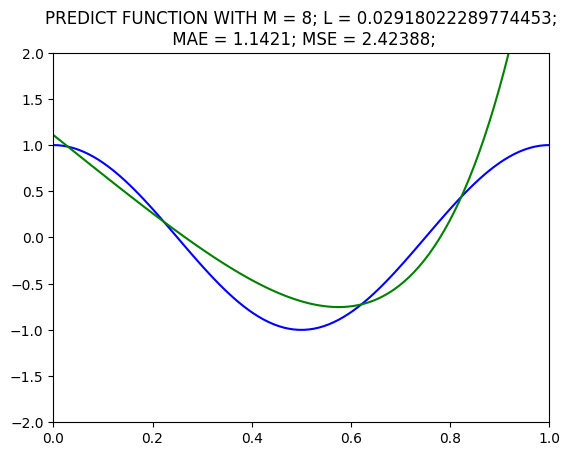

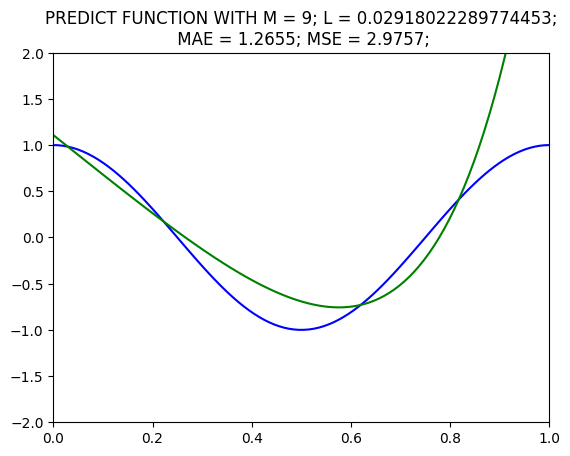

In [8]:
# Кол-во элементов в выборке
N = 24
z = np.linspace(0., 1., 100)
x_training, y_training, x_test, y_test = generate(N)
results_mae = []
results_mse = []

plt.title('ORIGINAL FUNCTION WITH ERROR')
plt.plot(z, fun(z), 'b-')
plt.plot(x_training, y_training, 'ro')
plt.show()

for l in np.arange(0, 0.03, np.e ** -7):
    for j in range(3, 10, 1):
        w = find_weights(x_training, y_training, j, l)
        d1 = np.array(list(map(fun, x_test)))
        d2 = np.array(list(map(lambda x: polynom(x=x, w=w), x_test)))
        diff_mae = mae(d1, d2)
        results_mae.append((j, l, diff_mae))
        diff_mse = mse(d1, d2)
        results_mse.append((j, l, diff_mse))
        plt.title(f'PREDICT FUNCTION WITH M = {j}; L = {l};\n MAE = {round(diff_mae, 5)}; MSE = {round(diff_mse, 5)};')
        plt.plot(z, fun(z), 'b-')
        plt.plot(z, polynom(z, w), 'g-')
        plt.xlim(0, 1)
        plt.ylim(-2, 2)
        plt.show()

Топ лучших наборов гиперпараметров:

In [9]:
for t in (sorted(results_mae, key=lambda t: t[2])[0:5:]):
    print(f'M = {t[0]}; l = {t[1]}; error = {t[2]}')

M = 4; l = 0.0; error = 0.15292728073619455
M = 3; l = 0.010030701621099682; error = 0.28272962130376944
M = 3; l = 0.0109425835866542; error = 0.28317813142509296
M = 3; l = 0.011854465552208716; error = 0.28886488262851506
M = 3; l = 0.012766347517763232; error = 0.29434934475748287


In [10]:
for t in (sorted(results_mse, key=lambda t: t[2])[0:5:]):
    print(f'M = {t[0]}; l = {t[1]}; error = {t[2]}')

M = 4; l = 0.0; error = 0.026628177875052454
M = 3; l = 0.011854465552208716; error = 0.10176053741903113
M = 3; l = 0.0109425835866542; error = 0.10201067598113092
M = 3; l = 0.012766347517763232; error = 0.10363094654662106
M = 3; l = 0.010030701621099682; error = 0.10465838730787269
